In [1]:
#import cv2 as cv
import importlib
import io
import matplotlib.pyplot as plt
import numpy as np
import os
#import openslide
from openslide import open_slide
from pathlib import Path
import pandas as pd
from PIL import Image, ImageOps, ImageChops, ImageDraw
import SimpleITK as sitk
from skimage.color import rgb2hed
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_holes
import staintools
from staintools import stain_normalizer, LuminosityStandardizer
from staintools.preprocessing.input_validation import is_uint8_image
import sys

In [2]:
# Import HEMnet package
BASE_DIR = Path().resolve().parent
HEMNET_DIR = BASE_DIR.joinpath('HEMnet')
sys.path.append(str(HEMNET_DIR))

from slide import *
from utils import *
from normaliser import LuminosityStandardizerIterative, ReinhardColorNormalizerIterative, StainNormalizerIterative

In [4]:
# User Input parameters
#SLIDES_PATH = Path('/gpfs1/scratch/90days/s4436005/Slides/gold_standards')
SLIDES_PATH = Path('/gpfs1/scratch/90days/s4436005')
OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/13_05_20_testing')
TEMPLATE_SLIDE_PATH = Path('/gpfs1/scratch/90days/s4436005/Slides/1957_T_9668_3_HandE.svs')

ALIGNMENT_MAG = 2
TILE_MAG = 10
VERBOSE = True
CANCER_THRESH = 0.39
NON_CANCER_THRESH = 0.40
#Allow user to select between 'none', 'reinhard', 'macenko' and 'vahadane'
NORMALISER_METHOD = "vahadane"

#Verbose functions
if VERBOSE:
    verbose_print = lambda *args: print(*args)
    verbose_save_img = lambda img, path, img_type: img.save(path, img_type)
    verbose_save_fig = lambda fig, path, dpi=300: fig.savefig(path, dpi=dpi)
else:
    verbose_print = lambda *args: None
    verbose_save_img = lambda *args: None
    verbose_save_fig = lambda *args: None

# Find Slides
slides = []
for slide in SLIDES_PATH.glob('*.svs'):
    name = slide.name
    slides.append(name)
slides.sort()
slides

['1820_N_10545A_2_HandE.svs',
 '1820_N_10545A_4_TP53.svs',
 '1820_T_105452F_2_HandE.svs',
 '1820_T_105452F_4_TP53.svs',
 '2065_N_12752A_2_HandE.svs',
 '2065_N_12752A_4_TP53.svs',
 '2065_T_12756A_2_HandE.svs',
 '2065_T_12756A_4_TP53.svs',
 '2112_N_12341B_2_HandE.svs',
 '2112_N_12341B_4_TP53.svs',
 '2112_T_12335F_2_HandE.svs',
 '2112_T_12335F_4_TP53.svs',
 '2148_N_11397A_2_HandE.svs',
 '2148_N_11397A_4_TP53.svs',
 '2148_T_11393A_2_HandE.svs',
 '2148_T_11393A_4_TP53.svs',
 '2171_N_11521A_2_HandE.svs',
 '2171_N_11521A_4_TP53.svs',
 '2171_T_11524A_2_HandE.svs',
 '2171_T_11524A_4_TP53.svs']

In [5]:
TP53_slides = [slide for slide in slides if 'TP53' in slide]
HE_slides = [slide for slide in slides if 'HandE' in slide]
Paired_slides = list(zip(TP53_slides, HE_slides))
print('Found {0} pairs of slides'.format(len(Paired_slides)))
for i, pair in enumerate(Paired_slides):
    tp53, he = pair
    verbose_print('{0}. {1}|{2}'.format(i + 1, tp53, he))

Found 10 pairs of slides
1. 1820_N_10545A_4_TP53.svs|1820_N_10545A_2_HandE.svs
2. 1820_T_105452F_4_TP53.svs|1820_T_105452F_2_HandE.svs
3. 2065_N_12752A_4_TP53.svs|2065_N_12752A_2_HandE.svs
4. 2065_T_12756A_4_TP53.svs|2065_T_12756A_2_HandE.svs
5. 2112_N_12341B_4_TP53.svs|2112_N_12341B_2_HandE.svs
6. 2112_T_12335F_4_TP53.svs|2112_T_12335F_2_HandE.svs
7. 2148_N_11397A_4_TP53.svs|2148_N_11397A_2_HandE.svs
8. 2148_T_11393A_4_TP53.svs|2148_T_11393A_2_HandE.svs
9. 2171_N_11521A_4_TP53.svs|2171_N_11521A_2_HandE.svs
10. 2171_T_11524A_4_TP53.svs|2171_T_11524A_2_HandE.svs


In [7]:
SLIDE_NUM = 0
PREFIX = Paired_slides[SLIDE_NUM][0][:-8]
verbose_print('Processing Slide: {0}'.format(PREFIX))
tp53_name, he_name = Paired_slides[SLIDE_NUM]
tp53_slide = open_slide(str(SLIDES_PATH.joinpath(tp53_name)))
he_slide = open_slide(str(SLIDES_PATH.joinpath(he_name)))

#Load Slides
he = read_slide_at_mag(he_slide, ALIGNMENT_MAG)
tp53 = read_slide_at_mag(tp53_slide, ALIGNMENT_MAG)

Processing Slide: 1820_N_10545A_4_


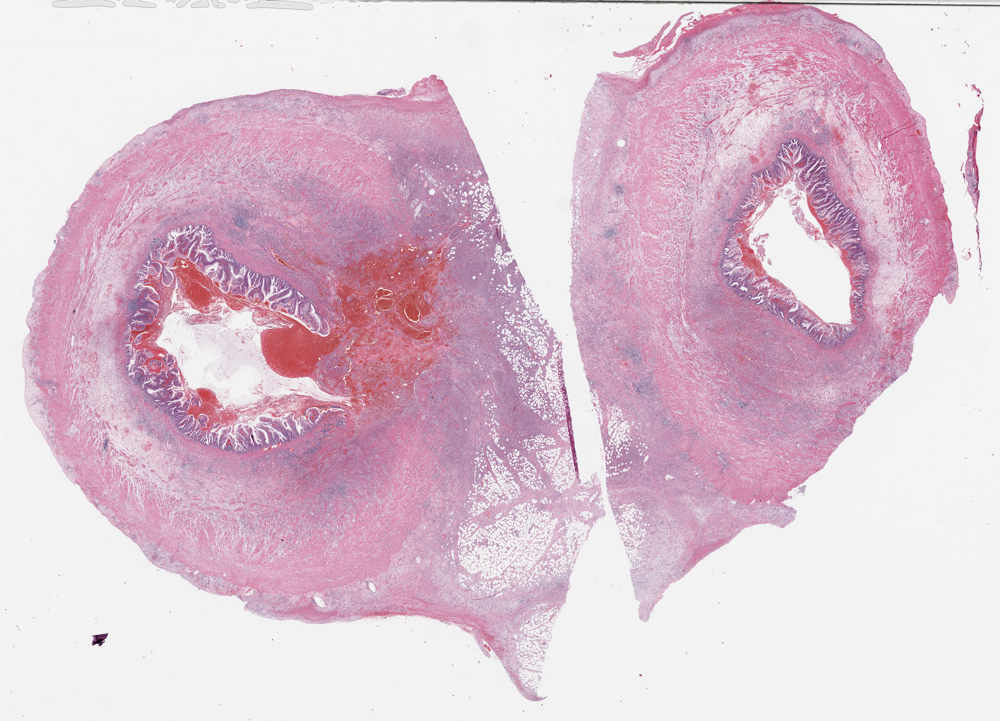

In [8]:
thumbnail(he)

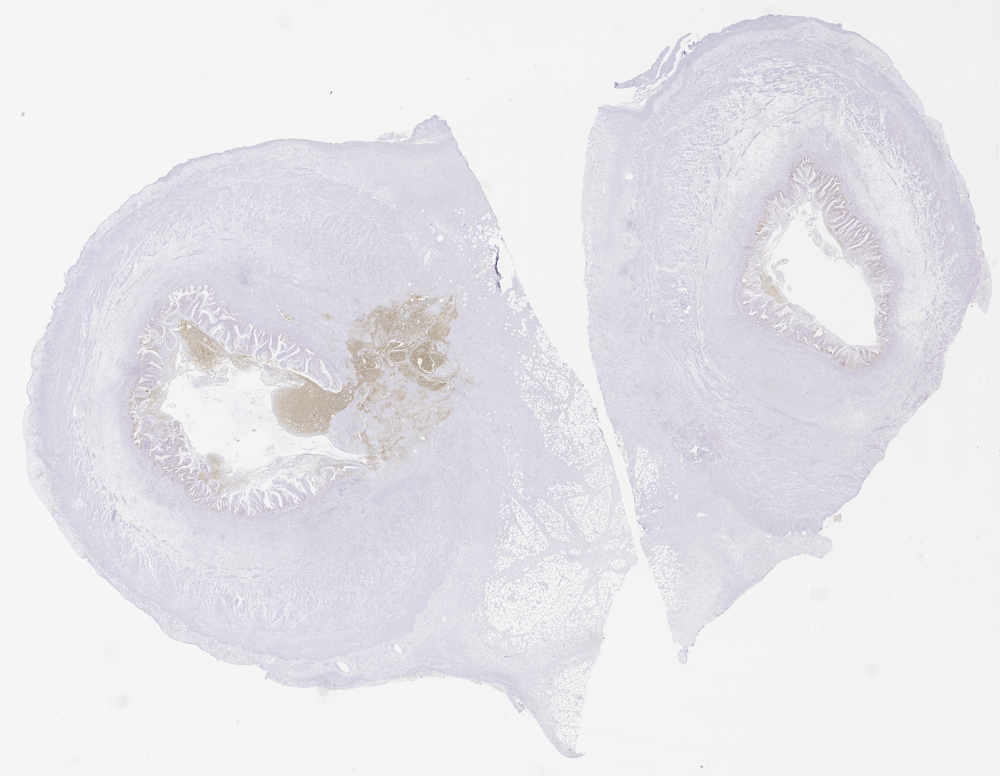

In [9]:
thumbnail(tp53)

In [11]:
######################
# Image Registration #
######################

INTERPOLATOR = sitk.sitkLanczosWindowedSinc

#Convert to grayscale
tp53_gray = tp53.convert('L')
he_gray = he.convert('L')
#he_gray = he_norm_small.convert('L')
#Convert to ITK format
tp53_itk = get_itk_from_pil(tp53_gray)
he_itk = get_itk_from_pil(he_gray)
#Set fixed and moving images
fixed_img = he_itk
moving_img = tp53_itk

In [13]:
# Check initial registration
# Centre the two images, then compare their alignment
initial_transform = sitk.CenteredTransformInitializer(fixed_img, moving_img, sitk.Euler2DTransform(), 
                                                      sitk.CenteredTransformInitializerFilter.GEOMETRY)
moving_rgb = sitk_transform_rgb(tp53, he, initial_transform)
comparison_pre = show_alignment(he, moving_rgb, prefilter = True)

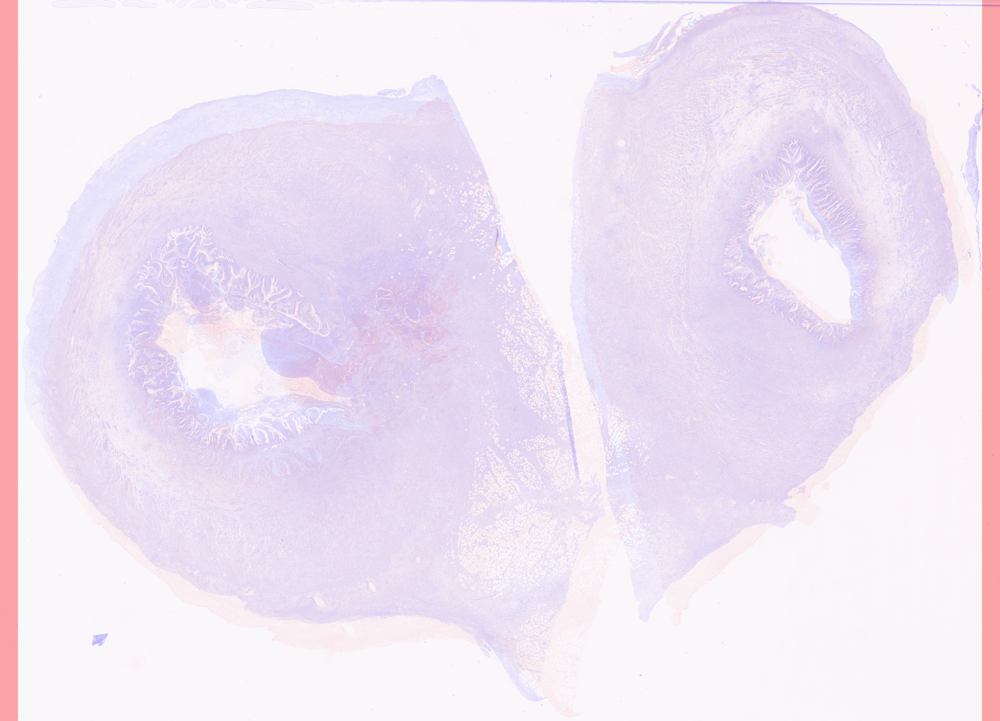

In [14]:
thumbnail(comparison_pre)

### Plot one image as a mosaic ontop the other image

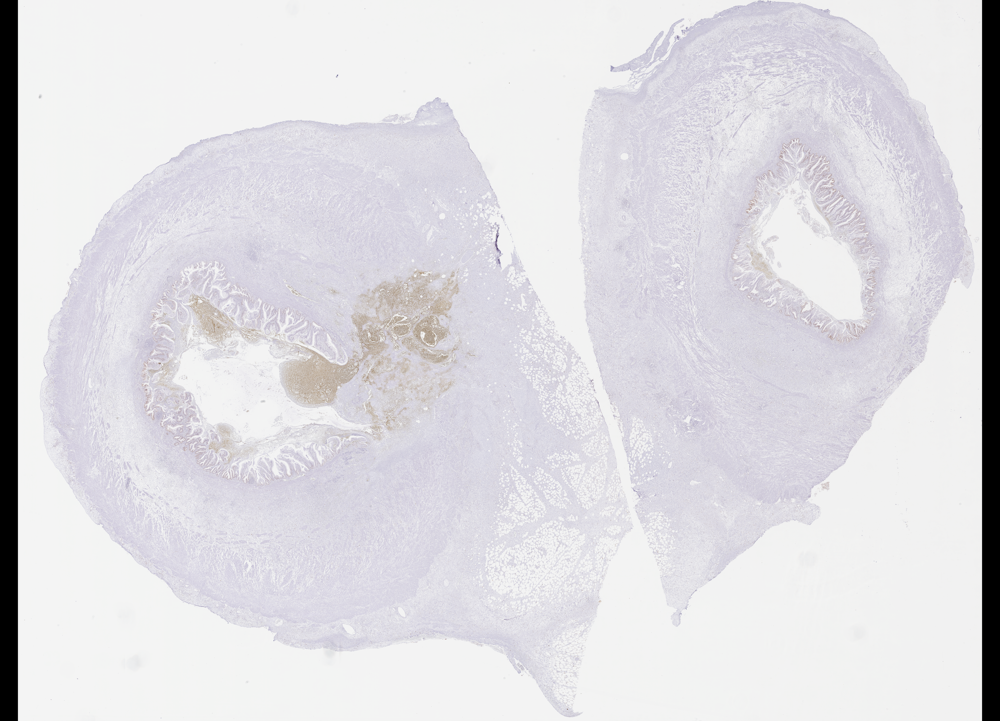

In [16]:
thumbnail(moving_rgb)

In [74]:
tgen = tile_gen(moving_rgb, tile_size = 299)

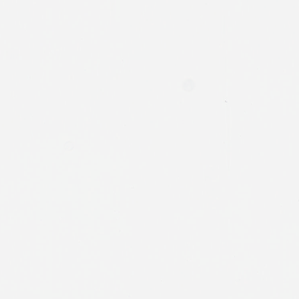

In [79]:
next(tgen)

In [80]:
def plot_mosaic(img, img2, tile_size = 299):
    tgen = tile_gen(img2, tile_size = tile_size)
    img_overlay = img.copy()
    tile_coords = tile_coordinates(img_overlay, tile_size)
    #print(tile_coords)
    _ = next(tgen)
    i = 0
    for row in tile_coords.itertuples(index = False):
        x_top_left, y_top_left = np.round(row[2:4])
        
        if i%2 == 0:
            #print(x_top_left, y_top_left)
            img_overlay.paste(next(tgen), (x_top_left, y_top_left))
        else:
            _ = next(tgen)
        i += 1
    return img_overlay
        
        

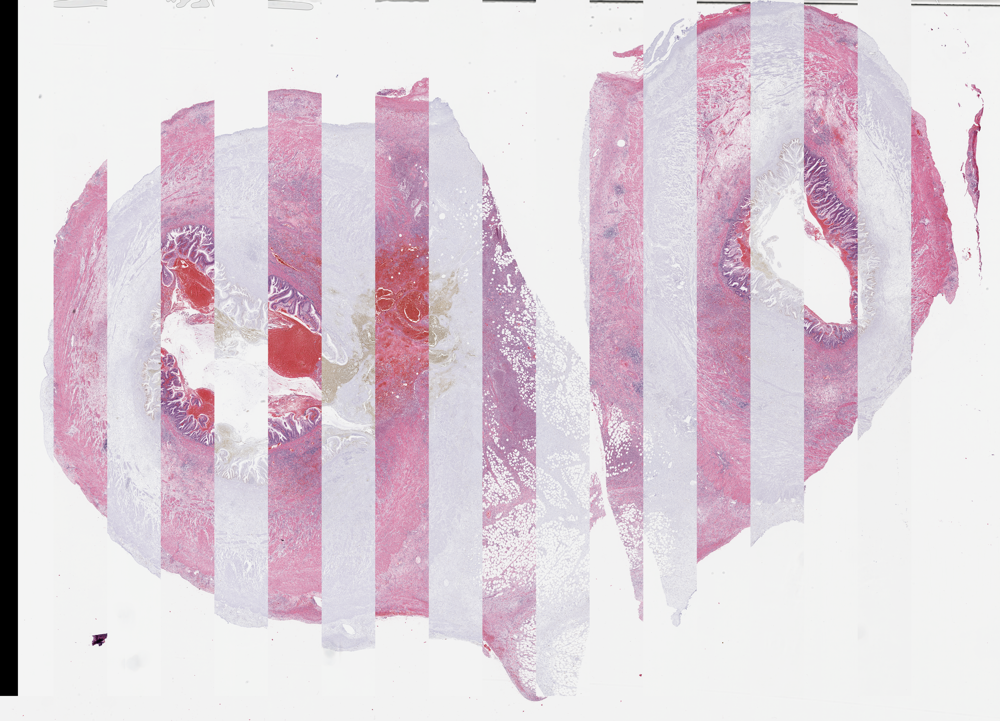

In [89]:
thumbnail(plot_mosaic(he, moving_rgb, 299))

### Plots slices of one image on top of another

In [92]:
mask_img = Image.new('L', he.size, 0)

In [93]:
mask_img.size

(5578, 4027)

In [195]:
#vertical slices
slice_width = 600
mask_img = Image.new('L', he.size, 0)
draw = ImageDraw.Draw(mask_img)
img_width, img_height = mask_img.size
x_top_left, y_top_left = 0, 0
x_bottom_right, y_bottom_right = slice_width, img_height
while x_top_left < img_width:
    draw.rectangle((x_top_left, y_top_left, x_bottom_right, img_height), fill = 255)
    x_top_left += slice_width*2
    x_bottom_right += slice_width*2

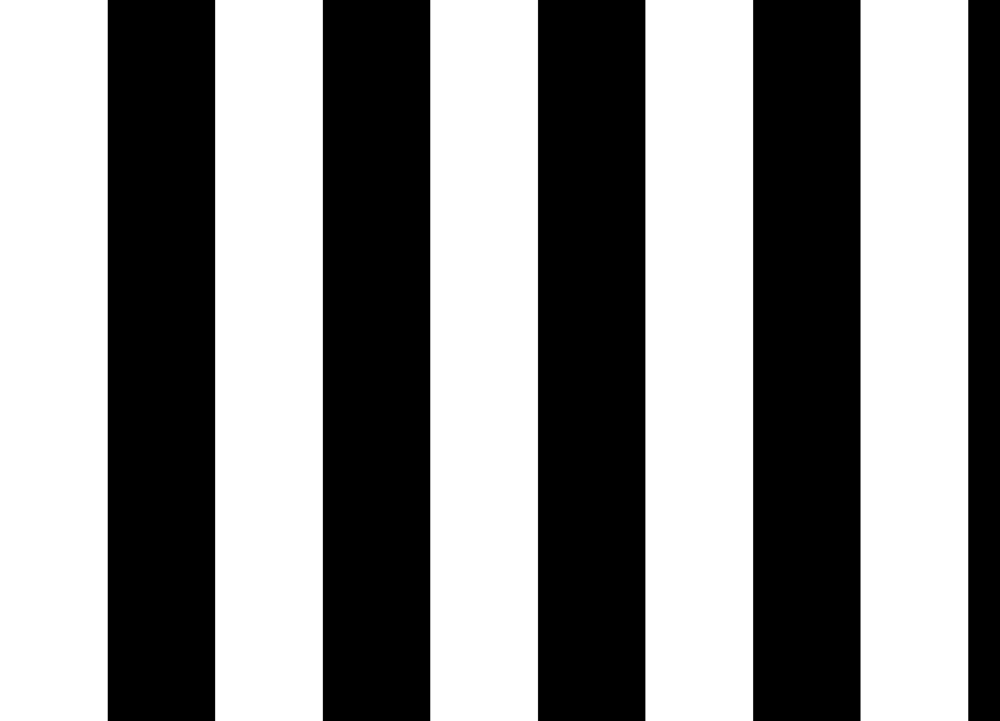

In [196]:
mask_img

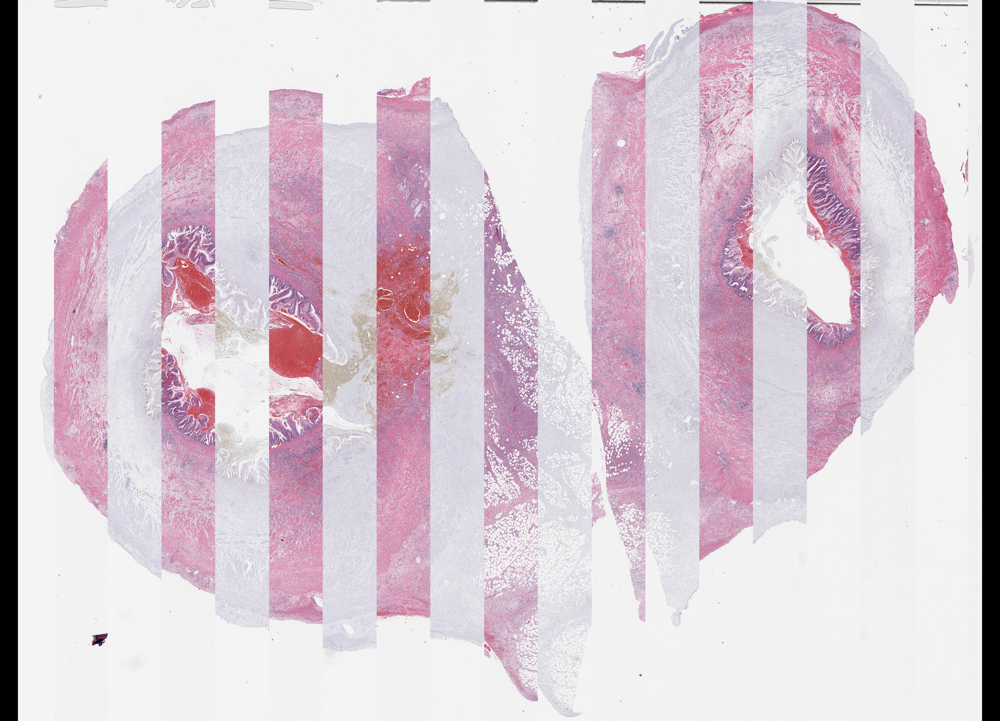

In [143]:
img_overlay = he.copy()
img_overlay.paste(moving_rgb, (0,0), mask_img)
thumbnail(img_overlay)

In [192]:
#horizontal slices
slice_width = 600
mask_img = Image.new('L', he.size, 0)
draw = ImageDraw.Draw(mask_img)
img_width, img_height = mask_img.size
x_top_left, y_top_left = 0, 0
x_bottom_right, y_bottom_right = img_width, slice_width
while y_top_left < img_height:
    draw.rectangle((x_top_left, y_top_left, x_bottom_right, y_bottom_right), fill = 255)
    y_top_left += slice_width*2
    y_bottom_right += slice_width*2

In [193]:
mask_img2 = mask_img

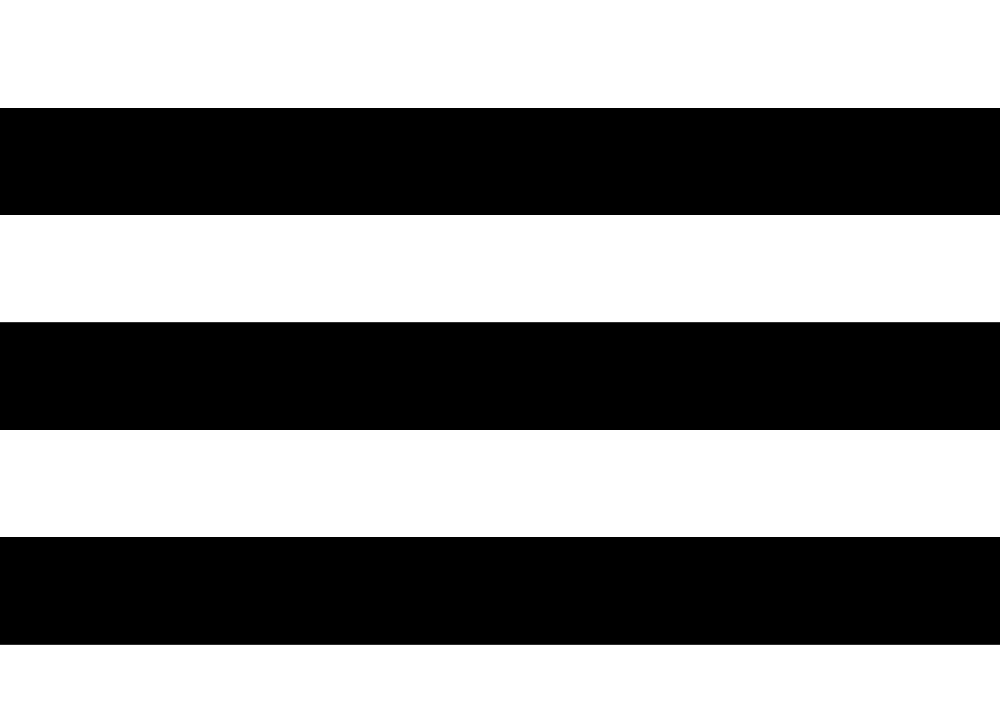

In [194]:
mask_img2

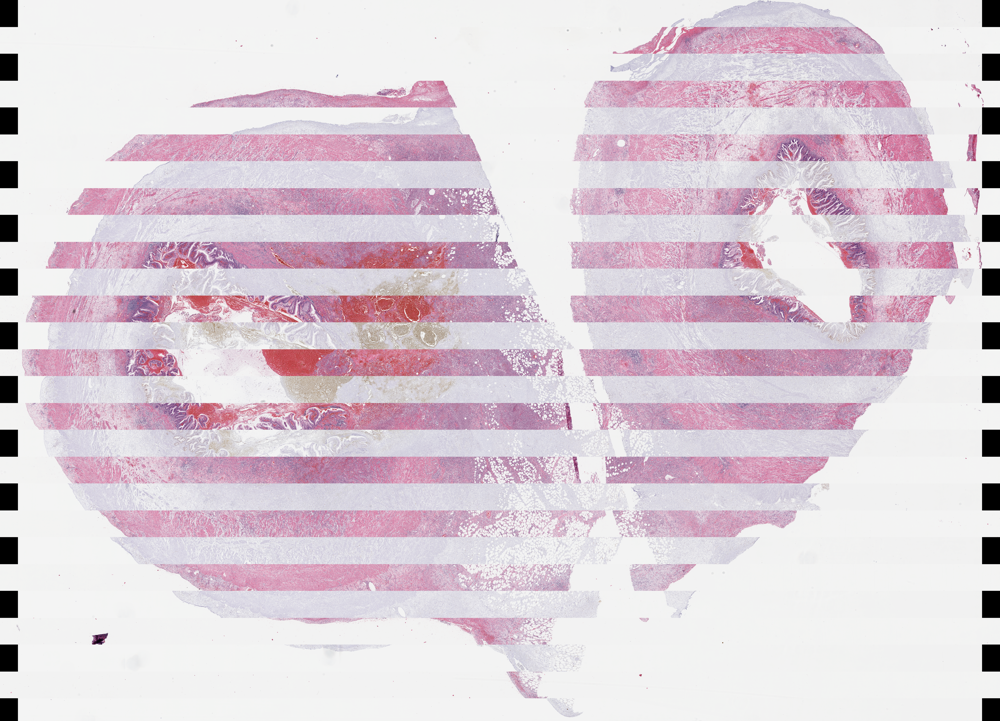

In [171]:
img_overlay = he.copy()
img_overlay.paste(moving_rgb, (0,0), mask_img)
thumbnail(img_overlay)

In [197]:
mask_overlay = ImageChops.difference(mask_img, mask_img2)

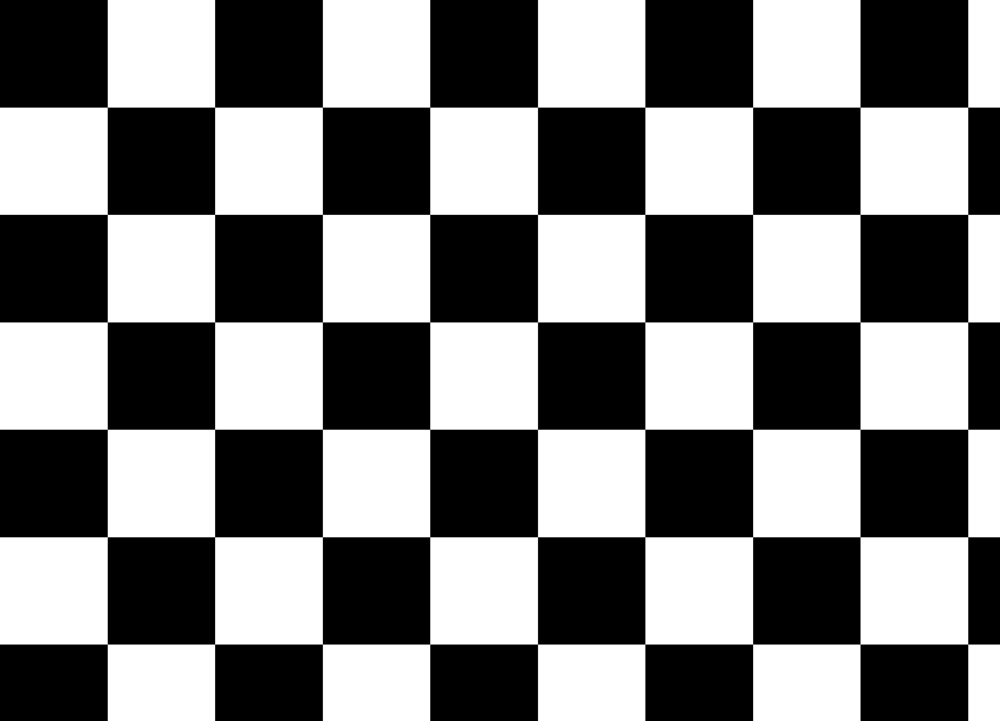

In [198]:
mask_overlay

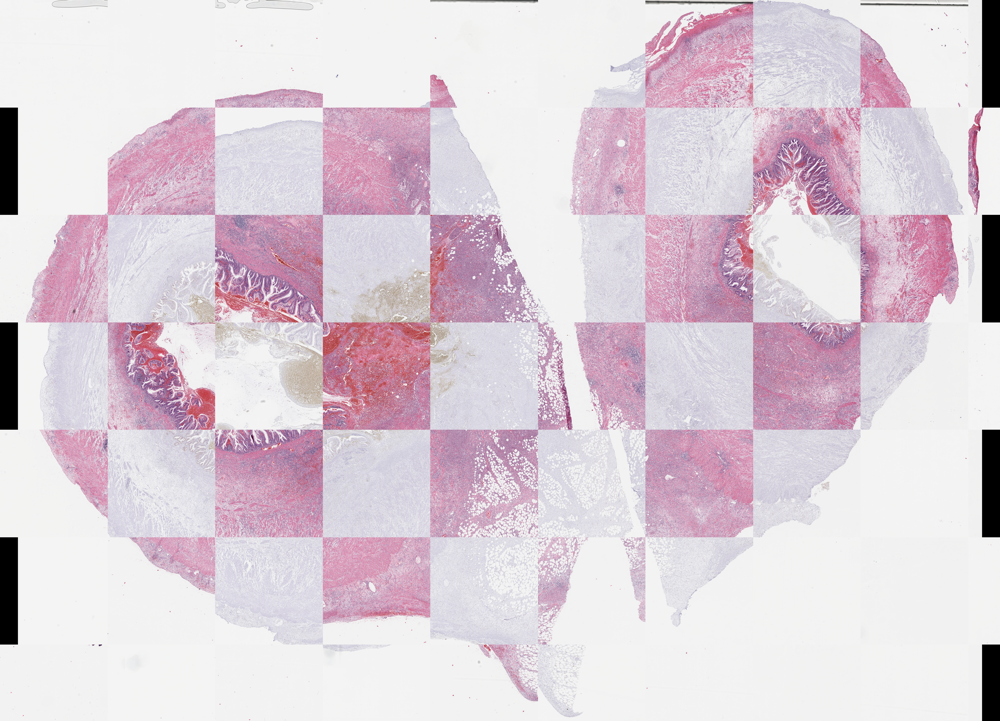

In [199]:
img_overlay = he.copy()
img_overlay.paste(moving_rgb, (0,0), mask_overlay)
thumbnail(img_overlay)